In [5]:
%pip install requests


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [6]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import requests
import io

In [7]:
image_1 = Image.open("image_1.png").convert('L')
image_array_1 = np.array(image_1)

image_2 = Image.open("image_2.png").convert('L')
image_array_2 = np.array(image_2)

image_3 = Image.open("image_3.png").convert('L')
image_array_3 = np.array(image_3)

image_4 = Image.open("image_4.jpg").convert('L')
image_array_4 = np.array(image_4)

image_5 = Image.open("image_5.jpg").convert('L')
image_array_5 = np.array(image_5)

image_6 = Image.open("image_6.jpg").convert('L')
image_array_6 = np.array(image_6)

image_7 = Image.open("image_7.png").convert('L')
image_array_7 = np.array(image_7)

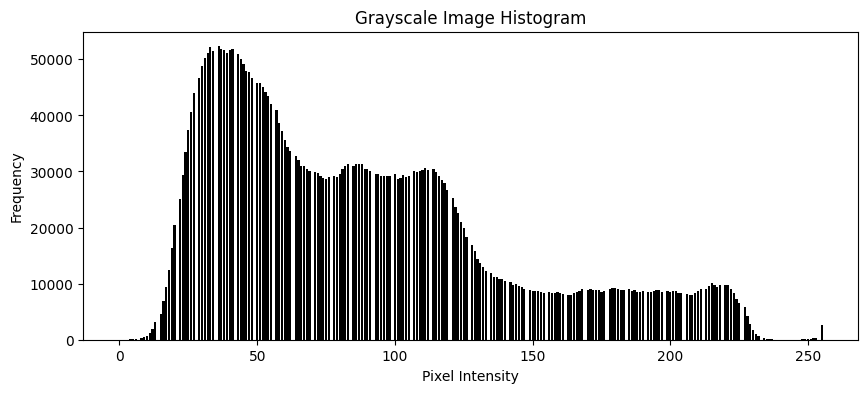

[1.9000e+01 1.3000e+01 1.1000e+01 2.8000e+01 4.4000e+01 7.9000e+01
 1.7100e+02 0.0000e+00 2.5300e+02 4.4000e+02 6.7500e+02 1.1510e+03
 1.9270e+03 3.0930e+03 0.0000e+00 4.5720e+03 6.8160e+03 9.3620e+03
 1.2368e+04 1.6437e+04 2.0524e+04 0.0000e+00 2.5046e+04 2.9286e+04
 3.3403e+04 3.7391e+04 4.0691e+04 4.3937e+04 0.0000e+00 4.6650e+04
 4.8795e+04 5.0205e+04 5.1078e+04 5.2184e+04 5.1500e+04 0.0000e+00
 5.2307e+04 5.1768e+04 5.1731e+04 5.1215e+04 5.1748e+04 5.1797e+04
 0.0000e+00 5.0913e+04 5.0056e+04 4.9196e+04 4.7980e+04 4.7666e+04
 4.6680e+04 0.0000e+00 4.5771e+04 4.5749e+04 4.5061e+04 4.4121e+04
 4.3454e+04 4.2043e+04 0.0000e+00 4.0884e+04 3.8631e+04 3.7224e+04
 3.5623e+04 3.4348e+04 3.3607e+04 0.0000e+00 3.2718e+04 3.2108e+04
 3.1035e+04 3.1030e+04 3.0380e+04 3.0016e+04 0.0000e+00 2.9920e+04
 2.9781e+04 2.9135e+04 2.8804e+04 2.8633e+04 2.8954e+04 0.0000e+00
 2.9193e+04 2.8984e+04 2.9550e+04 3.0498e+04 3.1058e+04 3.1348e+04
 0.0000e+00 3.1010e+04 3.1330e+04 3.1403e+04 3.1348e+04 3.0499

In [8]:
def CalculateHistogram(imageArray):
    histogram = np.zeros(256)
    for i in imageArray:
        for x in i:
            histogram[x] += 1
    return histogram

histogram = CalculateHistogram(image_array_1)

plt.figure(figsize=(10, 4))
plt.bar(range(256), histogram, color='black')
plt.title("Grayscale Image Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
#print(histogram.size)
plt.show()

print(histogram)

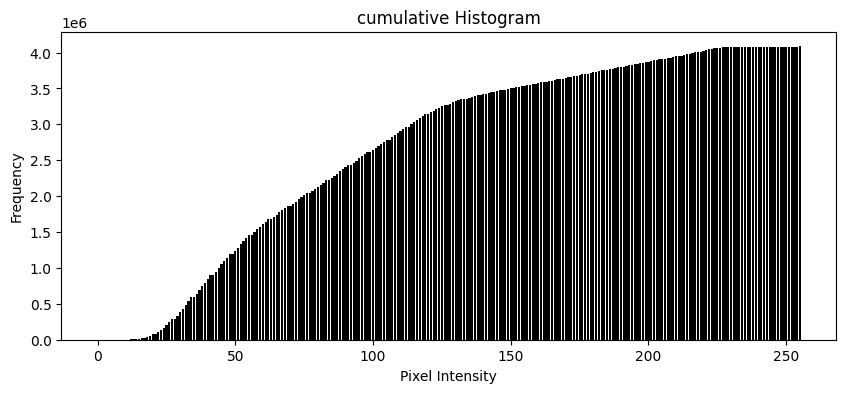

[1.900000e+01 3.200000e+01 4.300000e+01 7.100000e+01 1.150000e+02
 1.940000e+02 3.650000e+02 3.650000e+02 6.180000e+02 1.058000e+03
 1.733000e+03 2.884000e+03 4.811000e+03 7.904000e+03 7.904000e+03
 1.247600e+04 1.929200e+04 2.865400e+04 4.102200e+04 5.745900e+04
 7.798300e+04 7.798300e+04 1.030290e+05 1.323150e+05 1.657180e+05
 2.031090e+05 2.438000e+05 2.877370e+05 2.877370e+05 3.343870e+05
 3.831820e+05 4.333870e+05 4.844650e+05 5.366490e+05 5.881490e+05
 5.881490e+05 6.404560e+05 6.922240e+05 7.439550e+05 7.951700e+05
 8.469180e+05 8.987150e+05 8.987150e+05 9.496280e+05 9.996840e+05
 1.048880e+06 1.096860e+06 1.144526e+06 1.191206e+06 1.191206e+06
 1.236977e+06 1.282726e+06 1.327787e+06 1.371908e+06 1.415362e+06
 1.457405e+06 1.457405e+06 1.498289e+06 1.536920e+06 1.574144e+06
 1.609767e+06 1.644115e+06 1.677722e+06 1.677722e+06 1.710440e+06
 1.742548e+06 1.773583e+06 1.804613e+06 1.834993e+06 1.865009e+06
 1.865009e+06 1.894929e+06 1.924710e+06 1.953845e+06 1.982649e+06
 2.011282e

In [9]:
def CalculateCumulativeHistogram(array):
    cumulative= np.zeros(256)
    for x in range(len(array)):
        if(x>0):
            cumulative[x]=cumulative[x-1]+array[x]
        else:
            cumulative[x]=array[x]
    
    return cumulative

cumulativeHistogramArray = CalculateCumulativeHistogram(histogram)

plt.figure(figsize=(10, 4))
plt.bar(range(256), cumulativeHistogramArray, color='black')
plt.title("cumulative Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
#print(histogram.shape)
plt.show()
#print("the type of cumulative ",type(cumulative))

print(cumulativeHistogramArray)

In [10]:
def GetColorAtPercentage(cumulativeHistogram, percentage):
    intensity= cumulativeHistogram[-1]
    minThreshold = intensity * (percentage / 100)  #for 5%
    maxThreshold = intensity * (1-(percentage/100)) #for 95%

    minIntensity = None
    maxIntensity = None 
 
    for i, value in enumerate(cumulativeHistogram):
        if(value > maxThreshold):
            maxIntensity = i
            break

    for i, value in enumerate(cumulativeHistogram):
        if(value > minThreshold):
            minIntensity = i
            break
        

    return minIntensity, maxIntensity    
print(GetColorAtPercentage(cumulativeHistogramArray,15))

(36, 146)


In [11]:
def GetColorsAtMaxSlope(cumulativeHistogram):
    max_slope = -1
    max_i = 0
    max_j = 0
    
    for i in range(0, 255):
        for j in range(i + 1, 256):
            difference = cumulativeHistogram[j] - cumulativeHistogram[i]
            slope = (difference ** 4) / (j - i)
            
            if slope > max_slope:
                max_slope = slope
                max_i = i 
                max_j = j
    
    return max_i, max_j
print(GetColorsAtMaxSlope(cumulativeHistogramArray))

(15, 225)


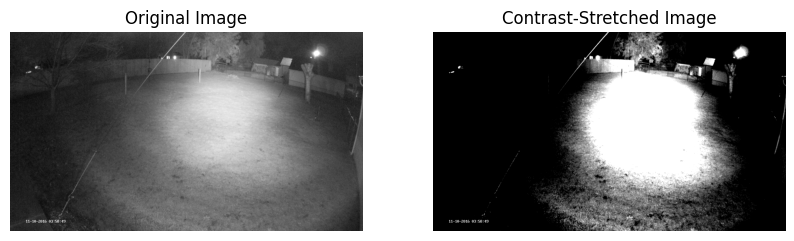

In [12]:
def StretchContrast(image_array, a, b, c, d):
    output_image = np.zeros_like(image_array, dtype=np.uint8)
    
    for i in range(image_array.shape[0]):
        for j in range(image_array.shape[1]):
            
            if c <= image_array[i, j] & image_array[i, j] <= d:
                output_image[i, j] =  ( ((image_array[i, j] - c) * ((b - a) / (d - c))) +a )
            elif image_array[i, j] < c:
                output_image[i, j] = a
            else:
                output_image[i, j] = b

    return output_image

stretched_image = StretchContrast(image_array_1,0 ,255, 88, 151)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_array_1, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(stretched_image, cmap="gray")
plt.title("Contrast-Stretched Image")
plt.axis("off")

plt.show()



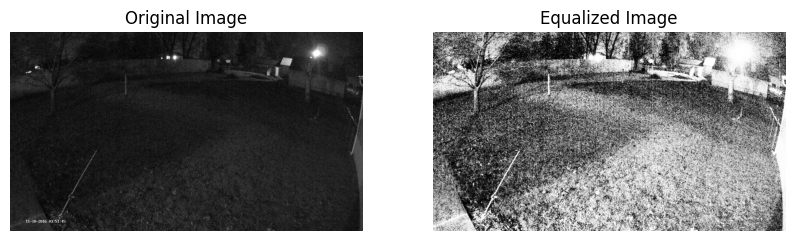

In [13]:
def EqualizeHistogram(image_array, a, b):
    histogram = CalculateHistogram(image_array)
    cumulative_histogram = CalculateCumulativeHistogram(histogram)

    total_pixels = image_array.size
    f_min = np.min(cumulative_histogram[cumulative_histogram > 0])
    f_max = cumulative_histogram[-1]
    #print(f_min)
    #print(f_max)

    equalized_image = np.zeros_like(image_array, dtype=np.uint8)

    for i in range(image_array.shape[0]):
        for j in range(image_array.shape[1]):
            f = image_array[i, j]

            if f < a:
                equalized_image[i, j] = a
            elif f > b:
                equalized_image[i, j] = b
            else:
                equalized_image[i, j] = ((((cumulative_histogram[f] - f_min) / (f_max - f_min)) * (b-a)) + a)


    return equalized_image

equalized_image = EqualizeHistogram(image_array_2, 0, 255)


plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_array_2, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap="gray")
plt.title("Equalized Image")
plt.axis("off")

plt.show()




In [14]:
def plot_histograms(image_array, min_intensity, max_intensity, title):
    histogram = CalculateHistogram(image_array)
    cumulative_histogram = CalculateCumulativeHistogram(histogram)

    plt.figure(figsize=(12, 5))
    
    # Histogram
    plt.subplot(1, 2, 1)
    plt.plot(histogram, color='black')
    plt.title(f"Histogram of {title}")
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    
    # Add vertical lines for min and max intensities
    plt.axvline(min_intensity, color='red', linestyle='dashed', linewidth=1)
    plt.axvline(max_intensity, color='red', linestyle='dashed', linewidth=1)
    plt.text(min_intensity + 5, max(histogram) * 0.05, f"Min: {min_intensity}", color='red')
    plt.text(max_intensity - 50, max(histogram) * 0.05, f"Max: {max_intensity}", color='red')
    
    # Cumulative Histogram
    plt.subplot(1, 2, 2)
    plt.plot(cumulative_histogram, color='blue')
    plt.title(f"Cumulative Histogram of {title}")
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Cumulative Frequency')

    # Add vertical lines for min and max intensities
    plt.axvline(min_intensity, color='red', linestyle='dashed', linewidth=1)
    plt.axvline(max_intensity, color='red', linestyle='dashed', linewidth=1)
    plt.text(min_intensity + 5, max(cumulative_histogram) * 0.05, f"Min: {min_intensity}", color='red')
    plt.text(max_intensity - 50, max(cumulative_histogram) * 0.05, f"Max: {max_intensity}", color='red')

    plt.tight_layout()
    plt.show()


def evaluate_analyze_histogram(cumulative_histogram):
    # Evaluate GetColorAtPercentage at {5,10,15} percentages
    results_percentage = {}
    for perc in [5, 10, 15]:
        min_intensity, max_intensity = GetColorAtPercentage(cumulative_histogram, perc)
        results_percentage[perc] = (min_intensity, max_intensity)
        print(f"For {perc}%: Min intensity = {min_intensity}, Max intensity = {max_intensity}")

    # Evaluate GetColorsAtMaxSlope
    min_slope_intensity, max_slope_intensity = GetColorsAtMaxSlope(cumulative_histogram)
    print(f"Max slope intensities: Min = {min_slope_intensity}, Max = {max_slope_intensity}")

    return results_percentage, (min_slope_intensity, max_slope_intensity)

def evaluate_modify_histogram(image_array, color_pairs_percentage, color_pair_max_slope):
    # Loop through each color intensity pair based on percentage bounds
    for perc, (min_intensity, max_intensity) in color_pairs_percentage.items():
        # Original image
        original_image = image_array
        plot_histograms(original_image, min_intensity, max_intensity, "Original Image")

        # Apply StretchContrast
        stretched_image = StretchContrast(image_array, a=0, b=255, c=min_intensity, d=max_intensity)
        plot_histograms(stretched_image, min_intensity, max_intensity, f"Stretched Image - {perc}% Bounds")

        # Apply EqualizeHistogram
        equalized_image = EqualizeHistogram(image_array, a=min_intensity, b=max_intensity)
        plot_histograms(equalized_image, min_intensity, max_intensity, f"Equalized Image - {perc}% Bounds")

        # Display Original, StretchContrast, and EqualizeHistogram images side-by-side
        plt.figure(figsize=(15, 5))
        
        # Original Image
        plt.subplot(1, 3, 1)
        plt.imshow(original_image, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")
        
        # Contrast-Stretched Image
        plt.subplot(1, 3, 2)
        plt.imshow(stretched_image, cmap="gray")
        plt.title(f"Contrast Stretching - {perc}% Bounds")
        plt.axis("off")
        
        # Histogram Equalized Image
        plt.subplot(1, 3, 3)
        plt.imshow(equalized_image, cmap="gray")
        plt.title(f"Histogram Equalization - {perc}% Bounds")
        plt.axis("off")
        
        plt.show()

    # Evaluate max slope color intensity pair
    min_intensity, max_intensity = color_pair_max_slope

    plot_histograms(image_array, min_intensity, max_intensity, "Original Image for Max Slope Bounds")

    stretched_image = StretchContrast(image_array, a=0, b=255, c=min_intensity, d=max_intensity)
    plot_histograms(stretched_image, min_intensity, max_intensity, "Stretched Image - Max Slope Bounds")

    equalized_image = EqualizeHistogram(image_array, a=min_intensity, b=max_intensity)
    plot_histograms(equalized_image, min_intensity, max_intensity, "Equalized Image - Max Slope Bounds")

    # Display Original, StretchContrast, and EqualizeHistogram images for max slope bounds
    plt.figure(figsize=(15, 5))
    
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(image_array, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")
    
    # Contrast-Stretched Image
    plt.subplot(1, 3, 2)
    plt.imshow(stretched_image, cmap="gray")
    plt.title("Contrast Stretching - Max Slope Bounds")
    plt.axis("off")
    
    # Histogram Equalized Image
    plt.subplot(1, 3, 3)
    plt.imshow(equalized_image, cmap="gray")
    plt.title("Histogram Equalization - Max Slope Bounds")
    plt.axis("off")
    
    plt.show()

For 5%: Min intensity = 26, Max intensity = 202
For 10%: Min intensity = 31, Max intensity = 174
For 15%: Min intensity = 36, Max intensity = 146
Max slope intensities: Min = 15, Max = 225


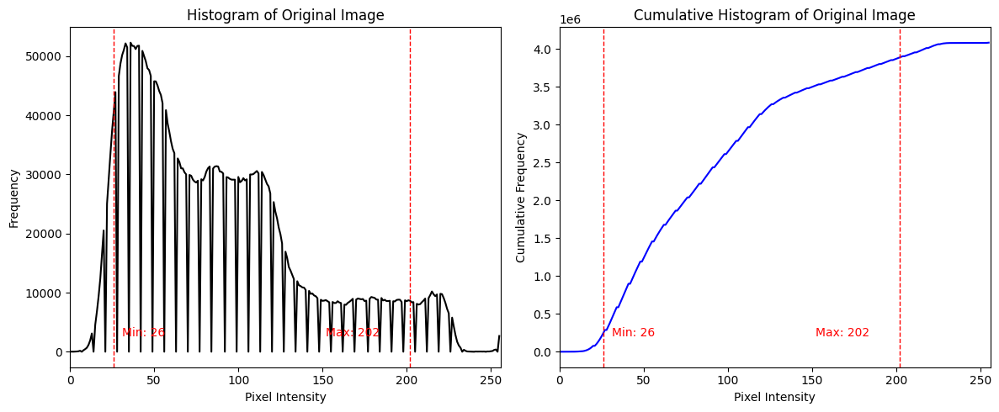

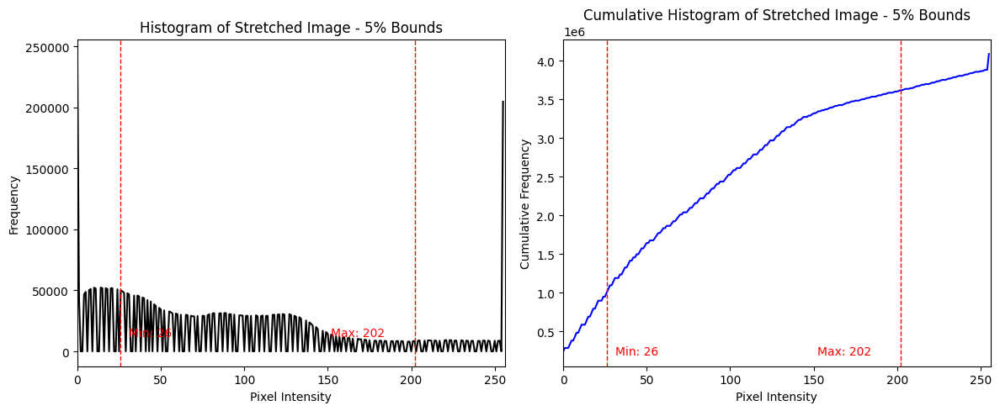

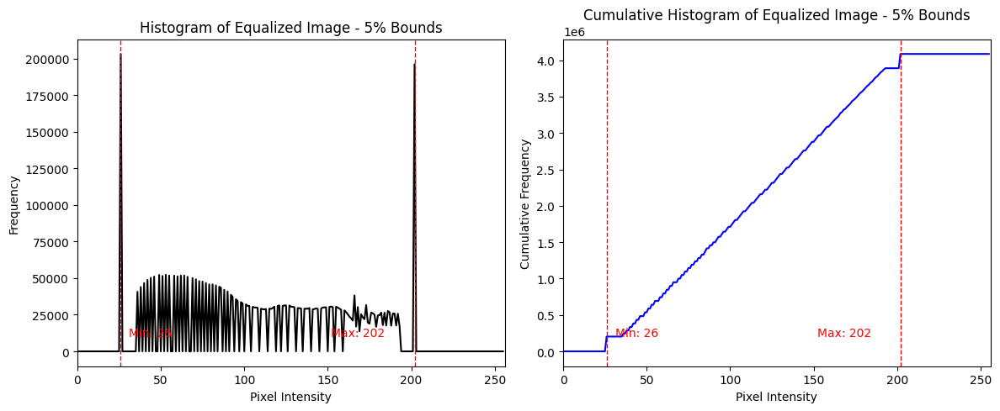

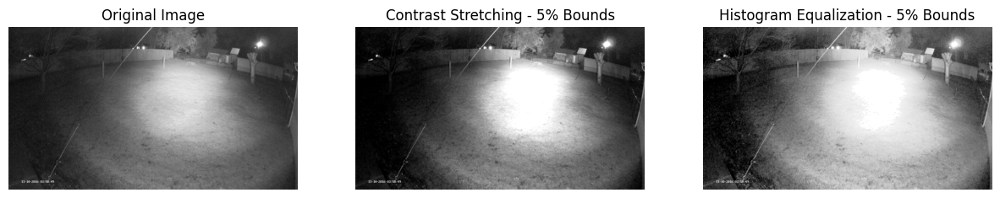

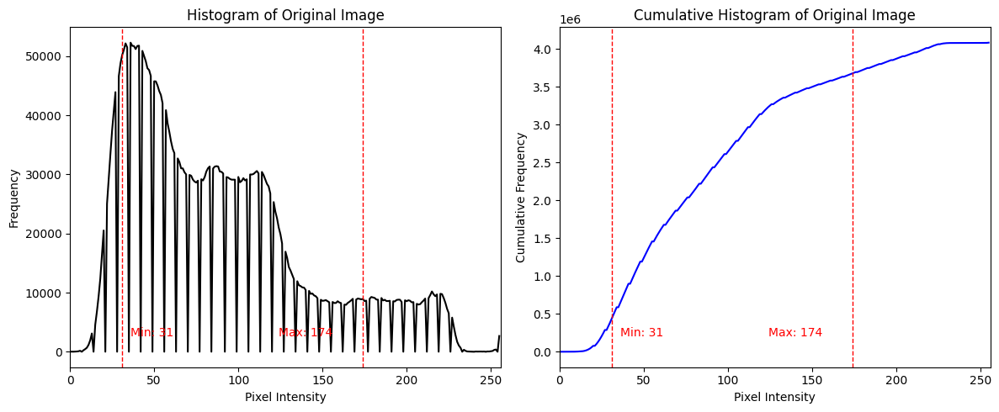

...

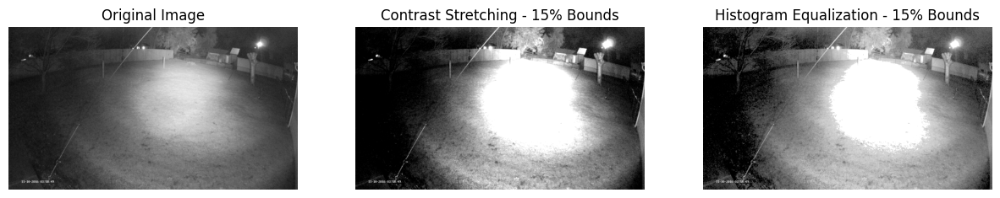

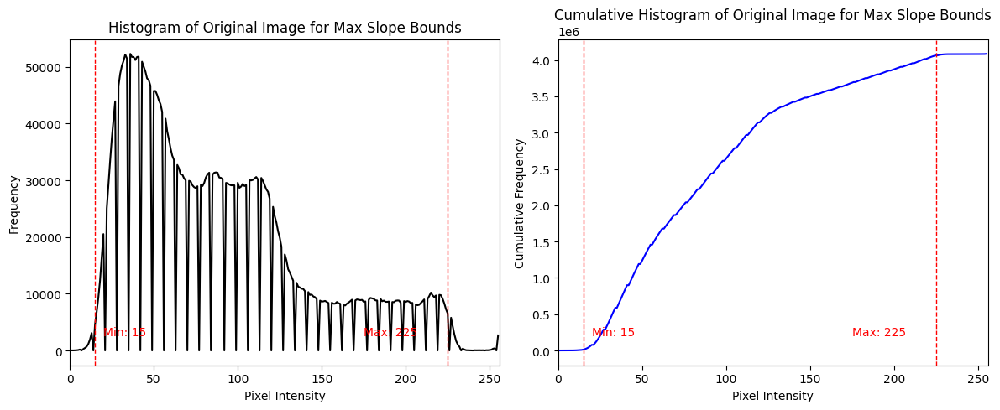

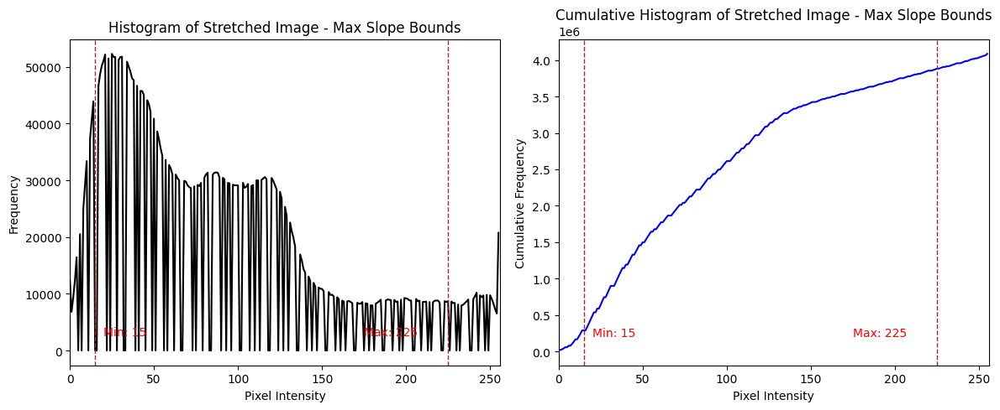

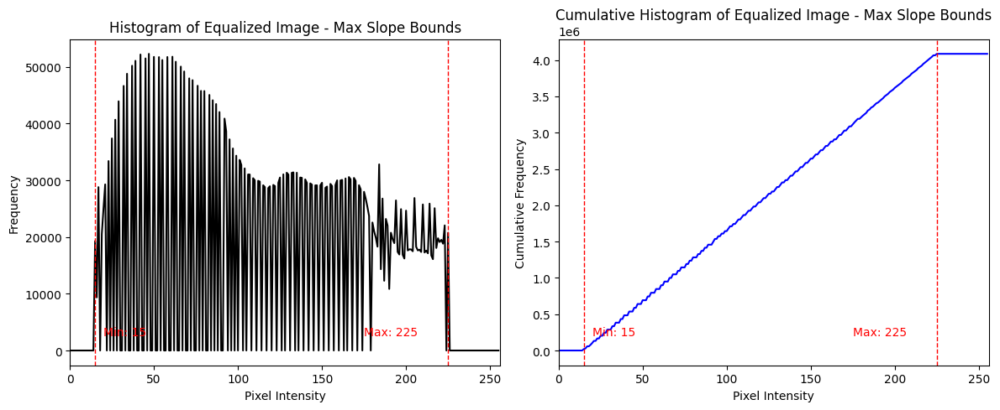

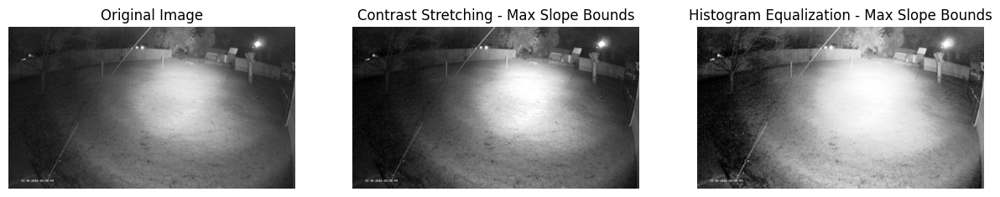

In [15]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_1))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_1, color_pairs_percentage, color_pair_max_slope)

For 5%: Min intensity = 13, Max intensity = 54
For 10%: Min intensity = 16, Max intensity = 46
For 15%: Min intensity = 18, Max intensity = 43
Max slope intensities: Min = 9, Max = 53


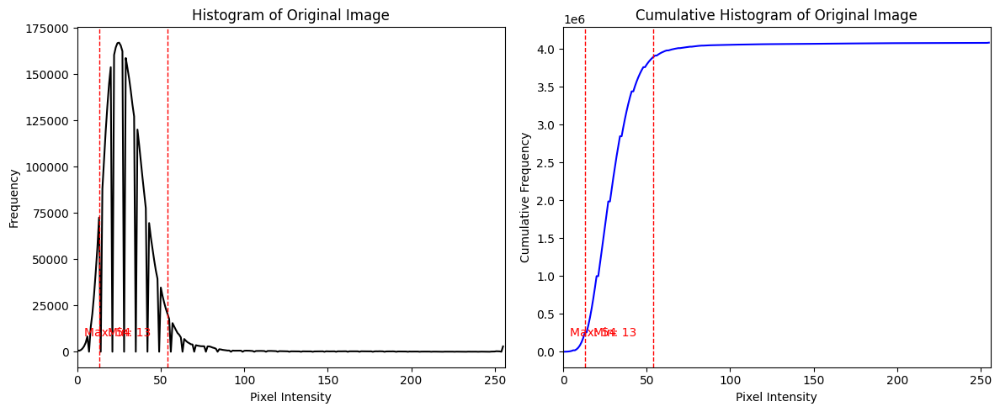

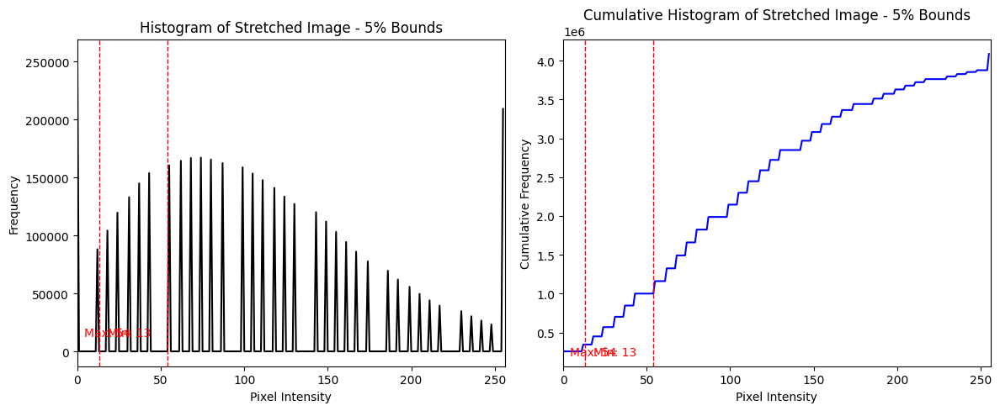

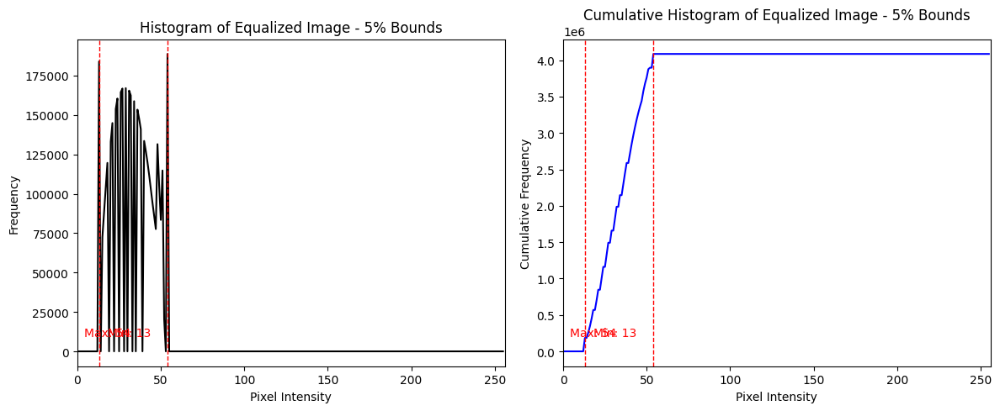

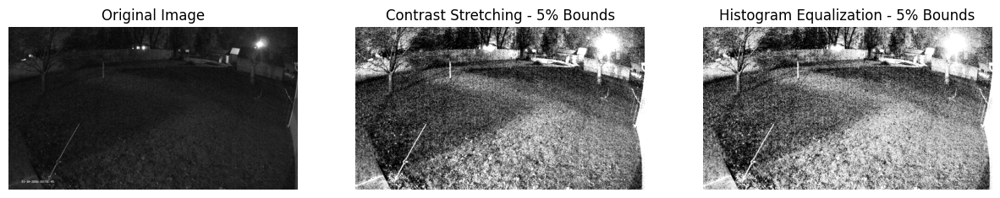

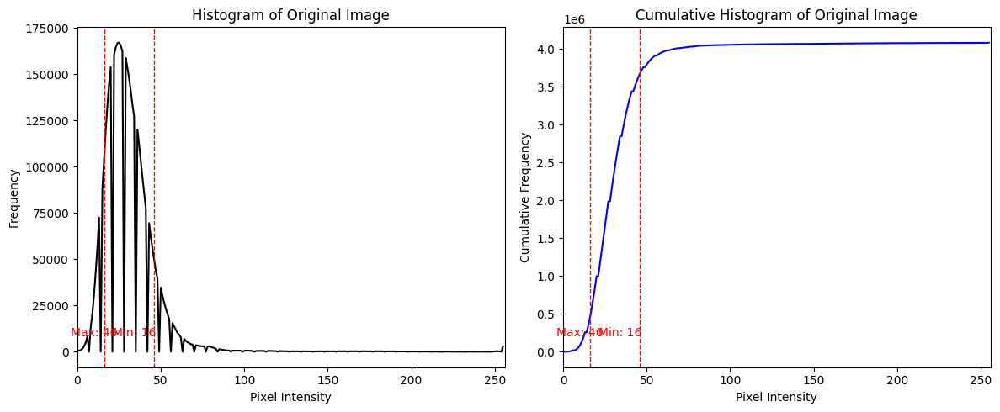

...

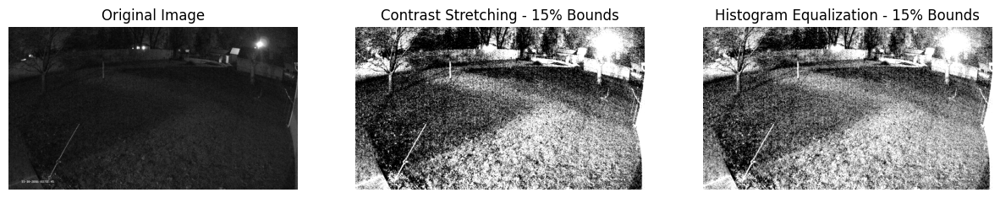

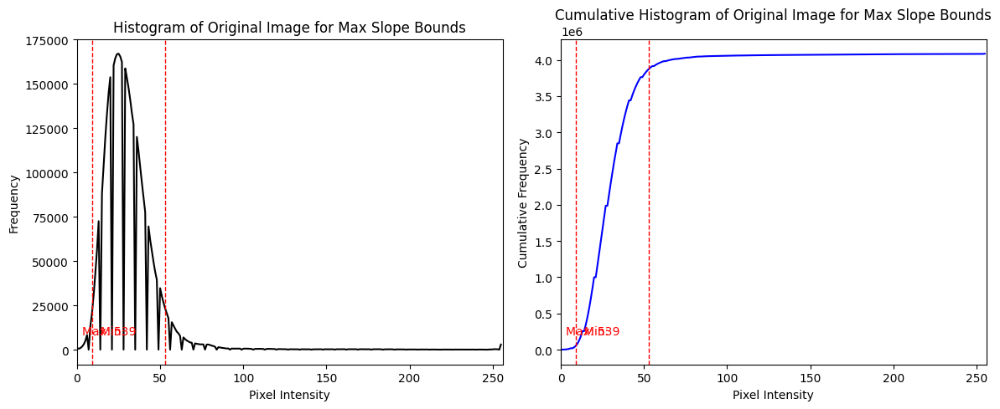

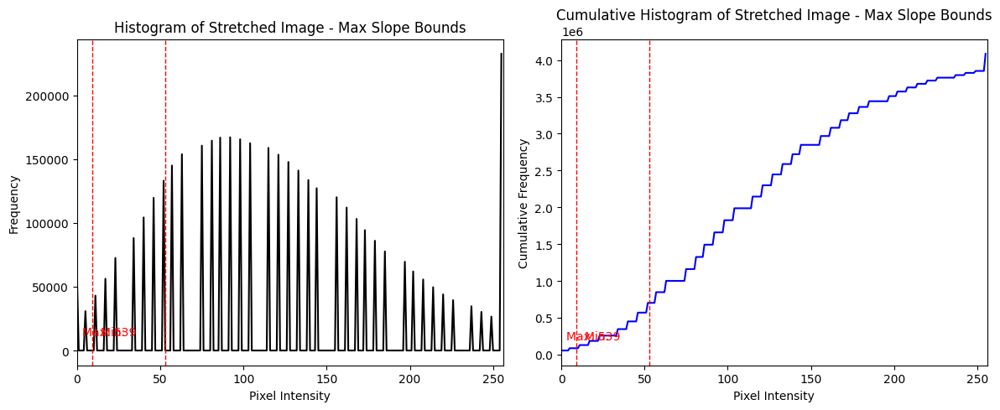

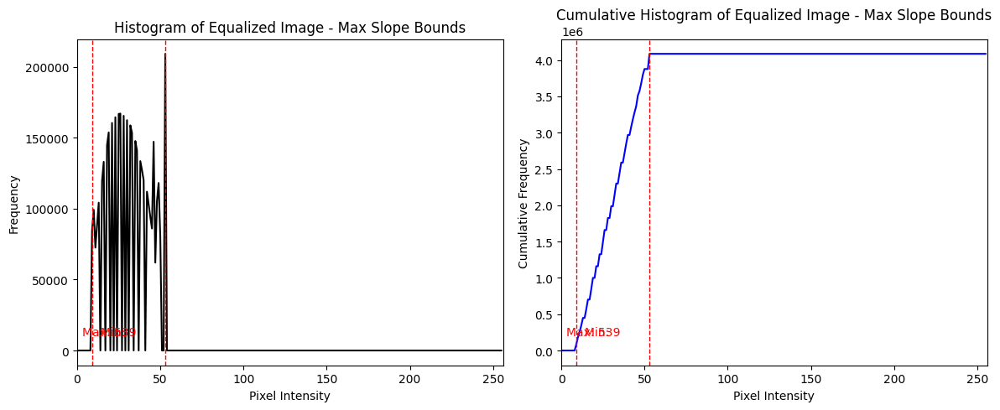

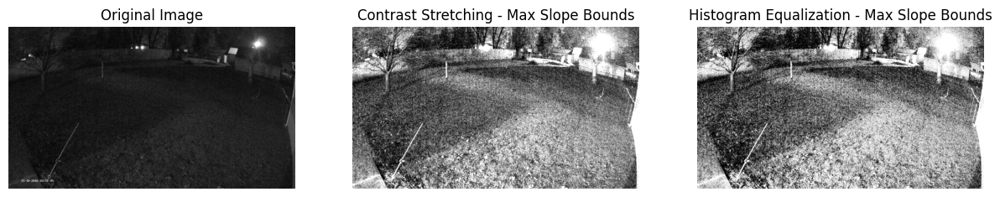

In [16]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_2))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_2, color_pairs_percentage, color_pair_max_slope)

For 5%: Min intensity = 30, Max intensity = 255
For 10%: Min intensity = 43, Max intensity = 207
For 15%: Min intensity = 51, Max intensity = 173
Max slope intensities: Min = 7, Max = 255


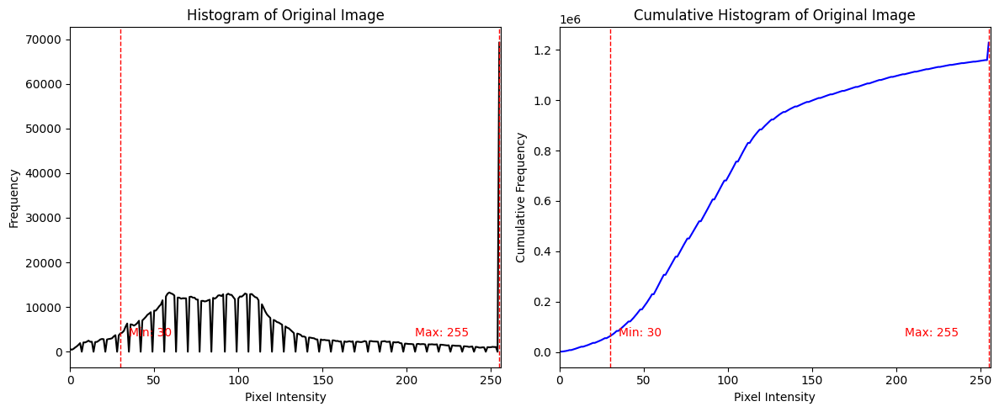

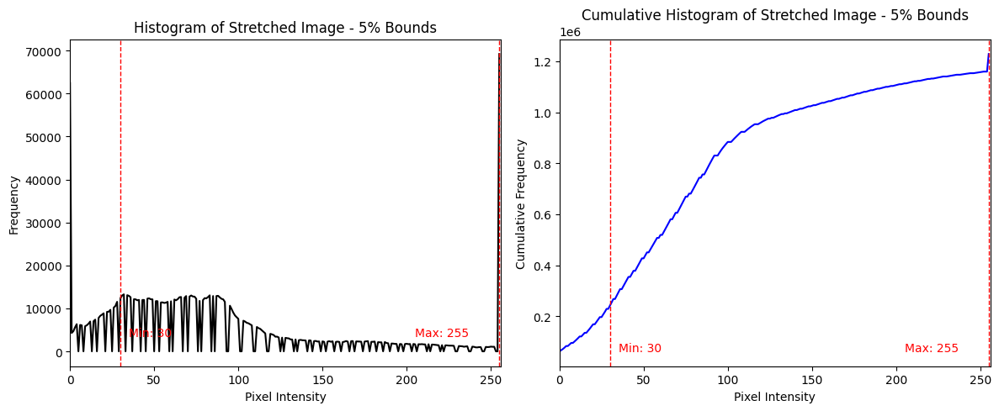

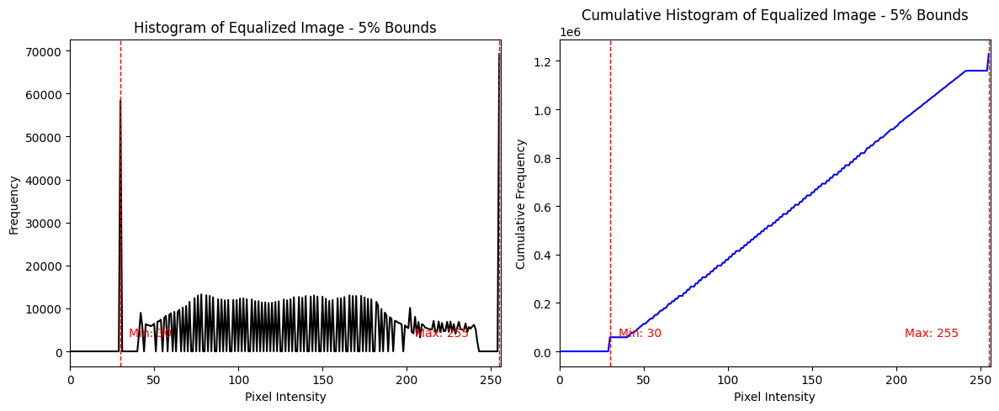

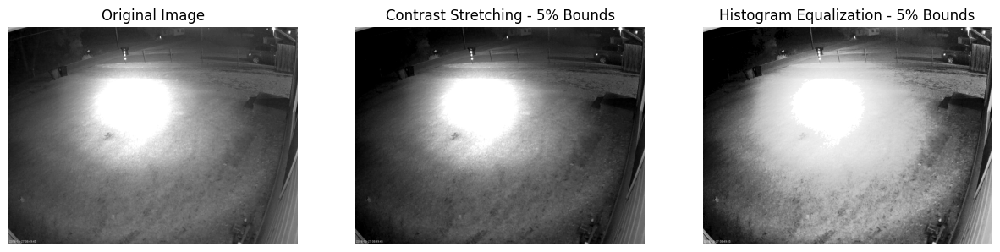

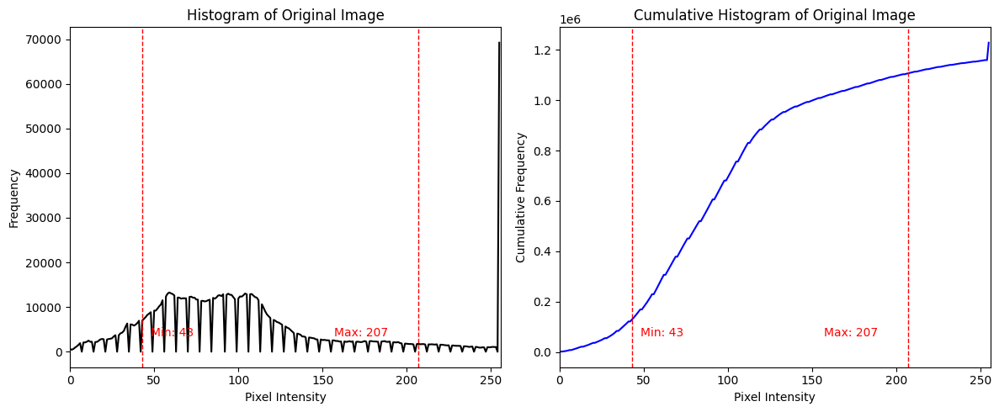

...

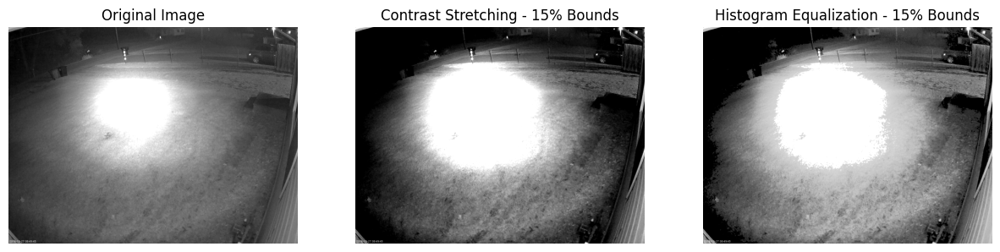

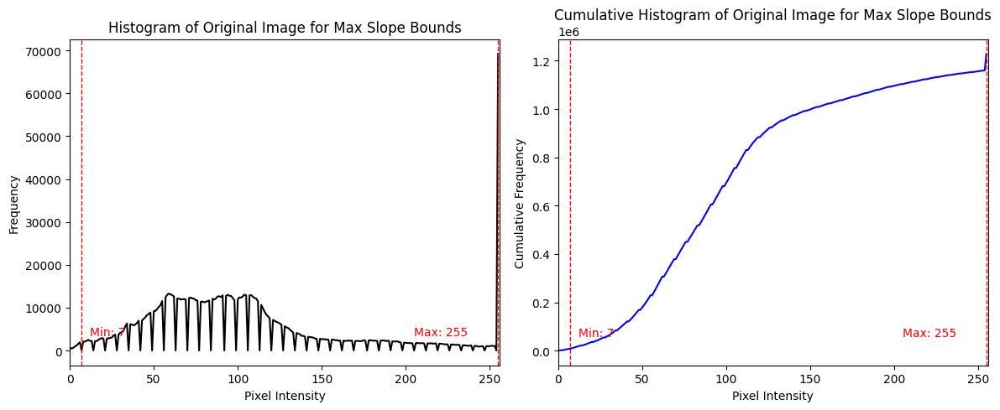

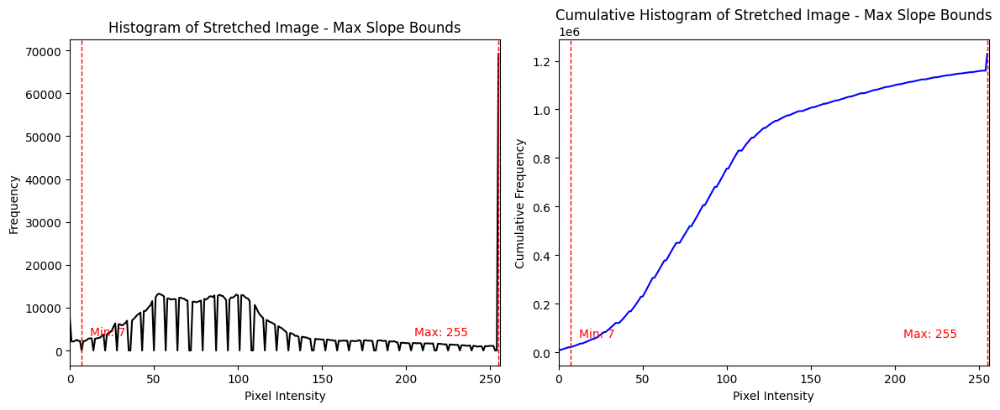

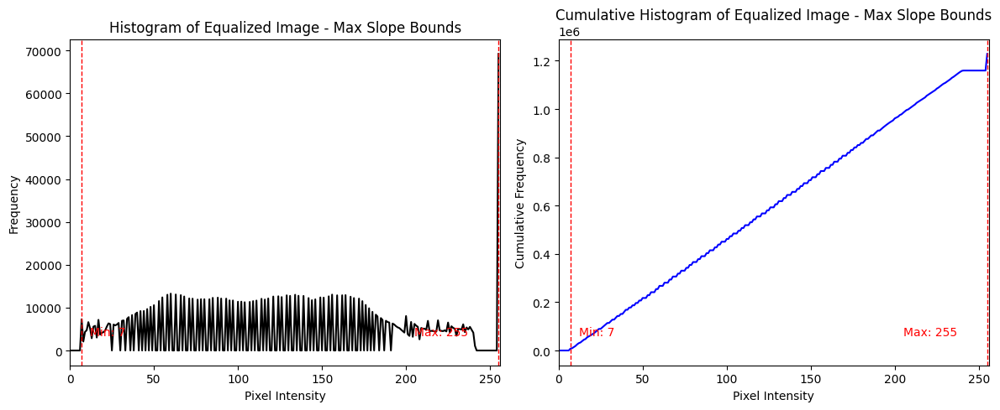

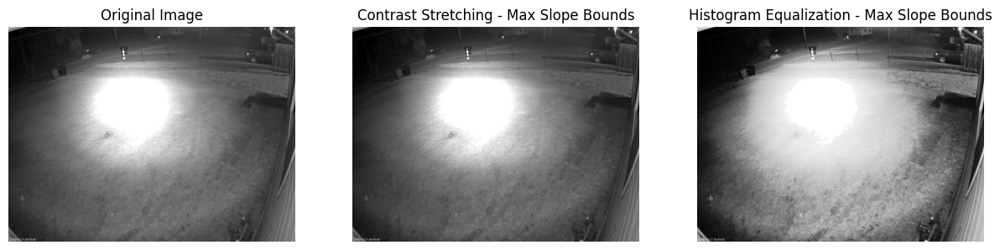

In [17]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_3))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_3, color_pairs_percentage, color_pair_max_slope)

For 5%: Min intensity = 48, Max intensity = 171
For 10%: Min intensity = 52, Max intensity = 160
For 15%: Min intensity = 55, Max intensity = 149
Max slope intensities: Min = 37, Max = 183


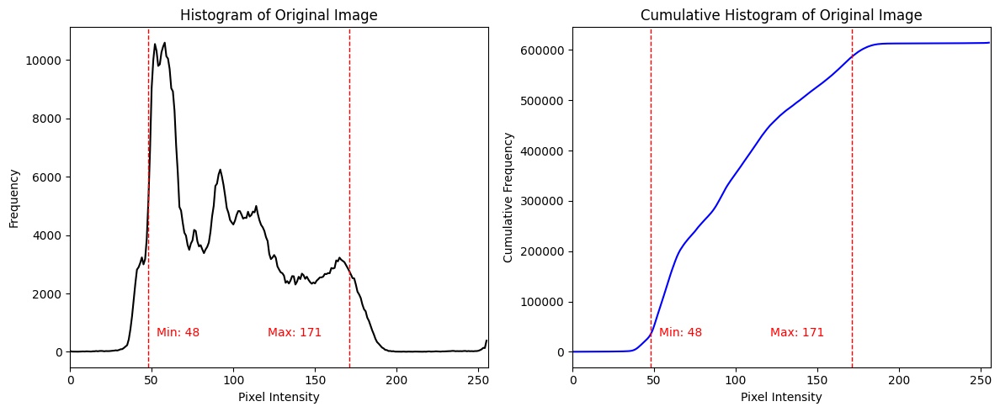

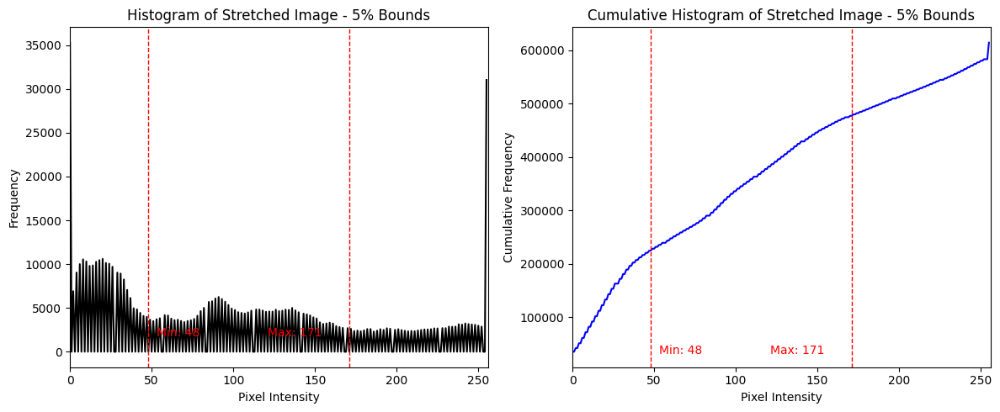

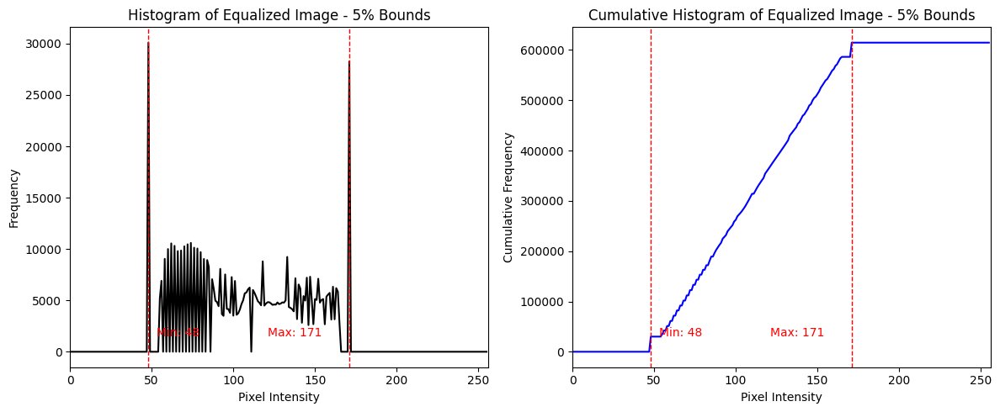

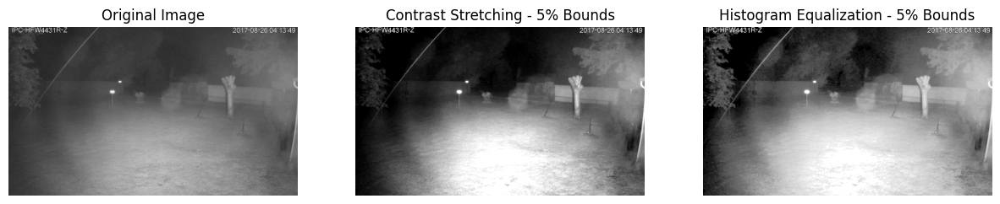

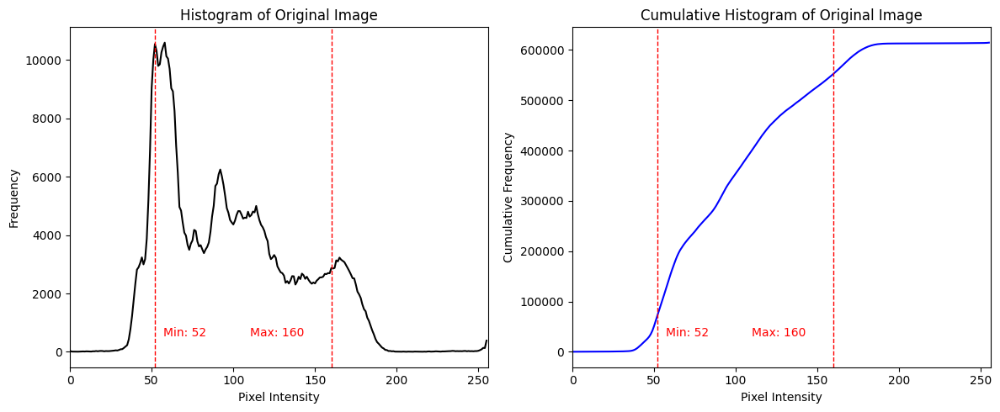

...

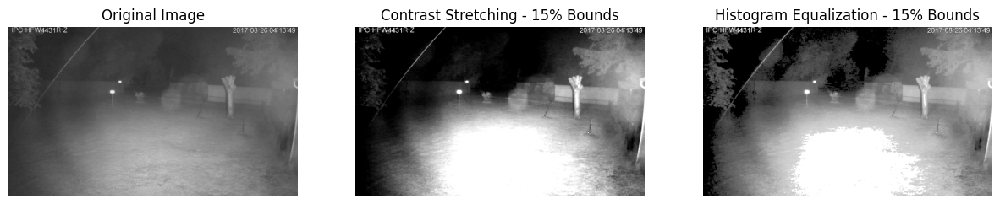

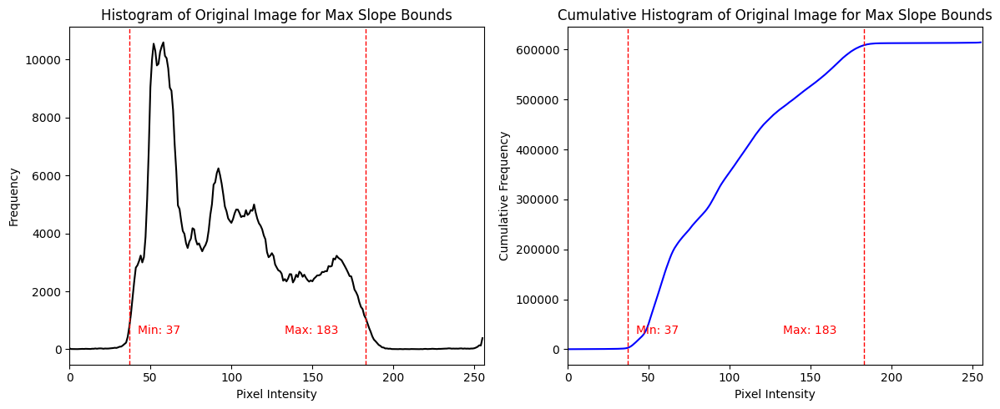

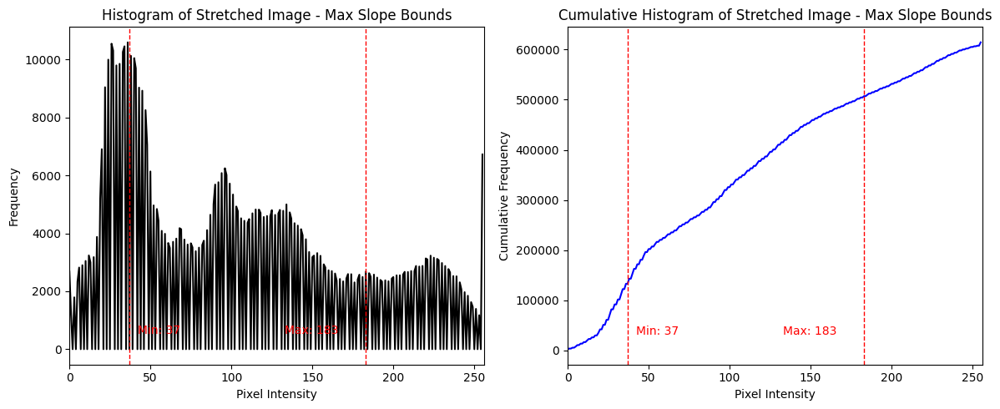

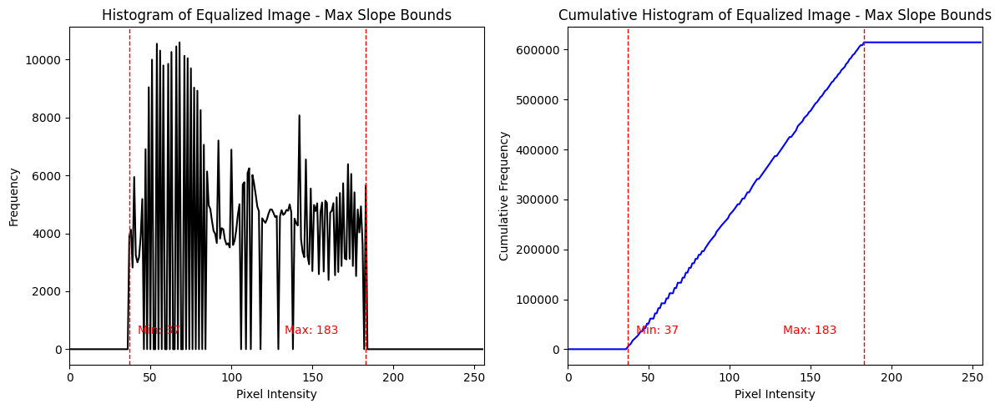

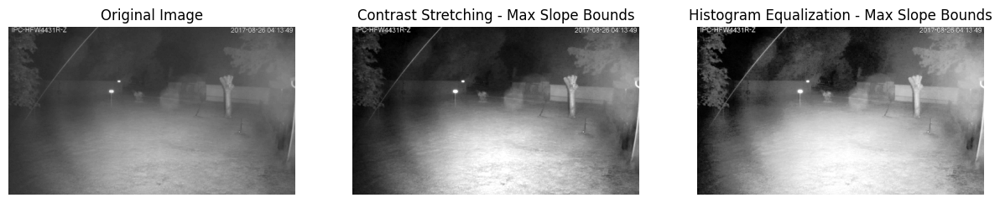

In [18]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_4))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_4, color_pairs_percentage, color_pair_max_slope)

For 5%: Min intensity = 17, Max intensity = 64
For 10%: Min intensity = 19, Max intensity = 52
For 15%: Min intensity = 21, Max intensity = 46
Max slope intensities: Min = 15, Max = 53


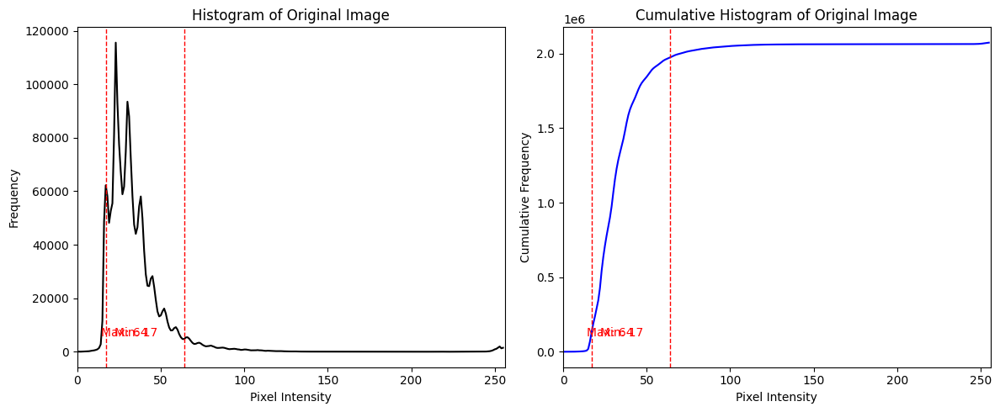

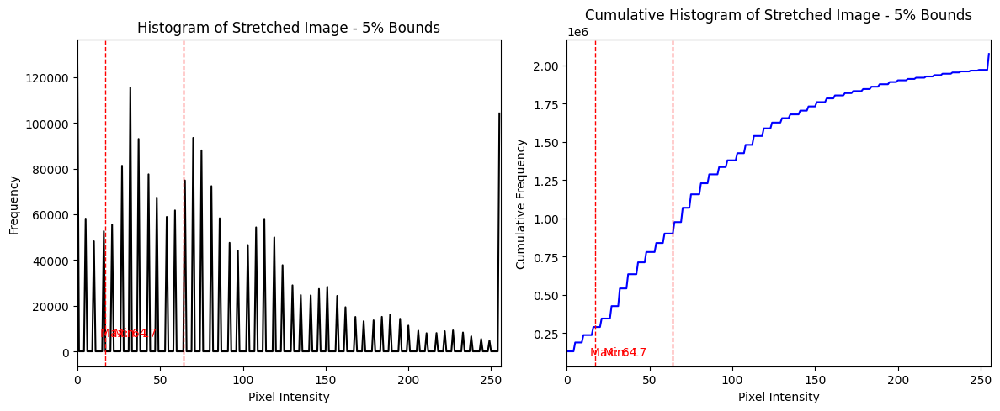

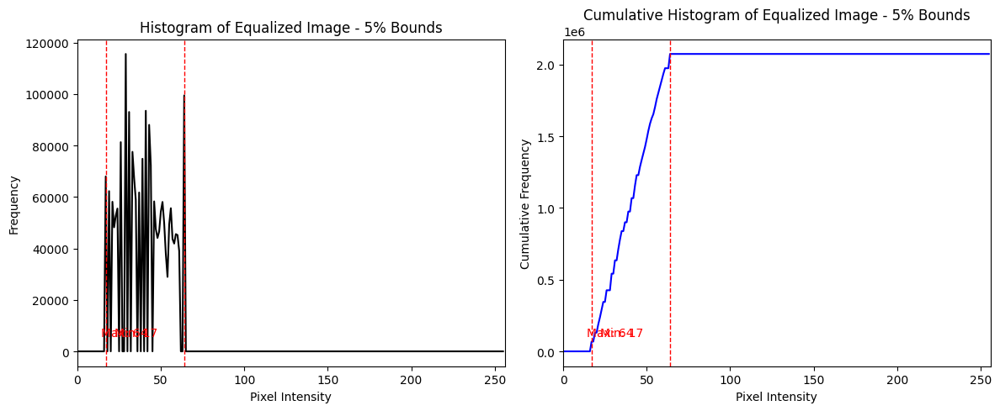

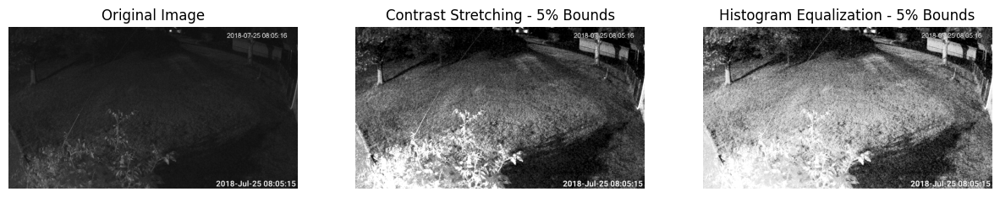

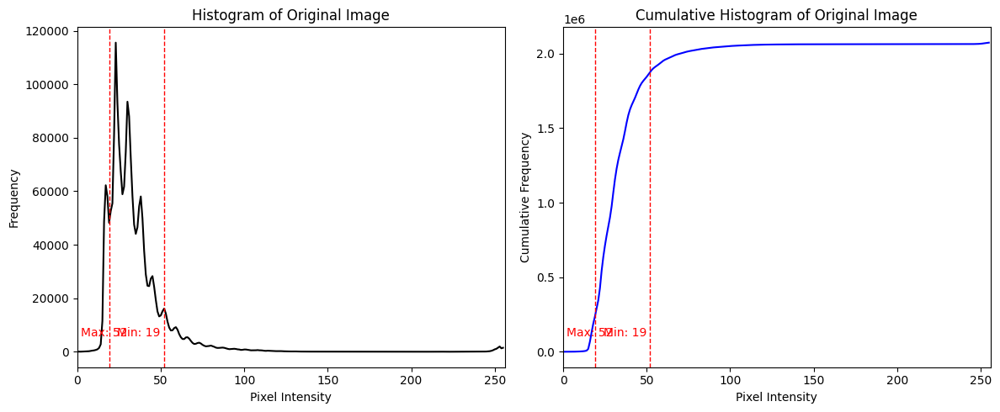

...

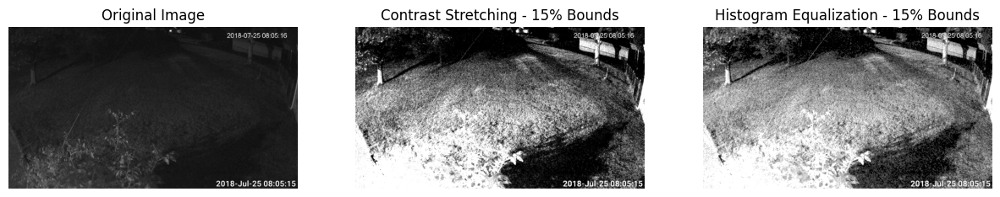

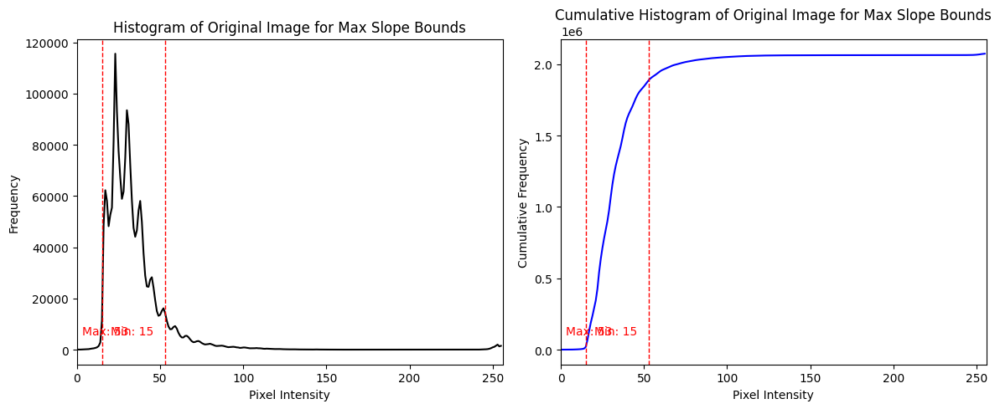

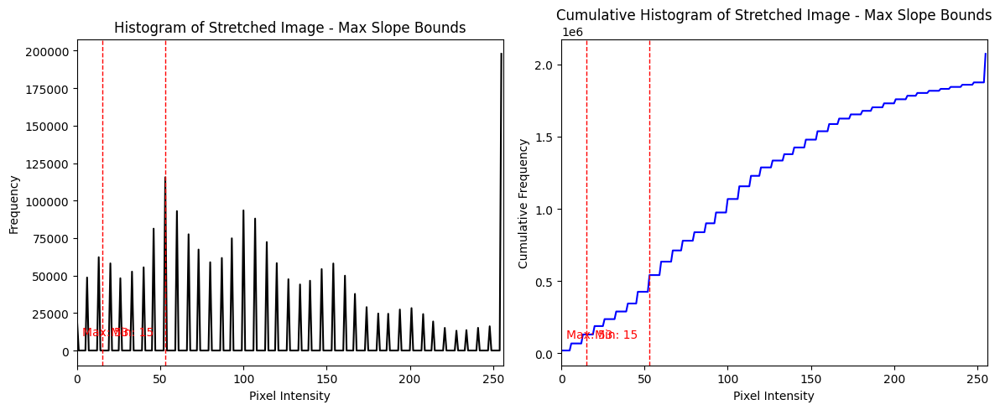

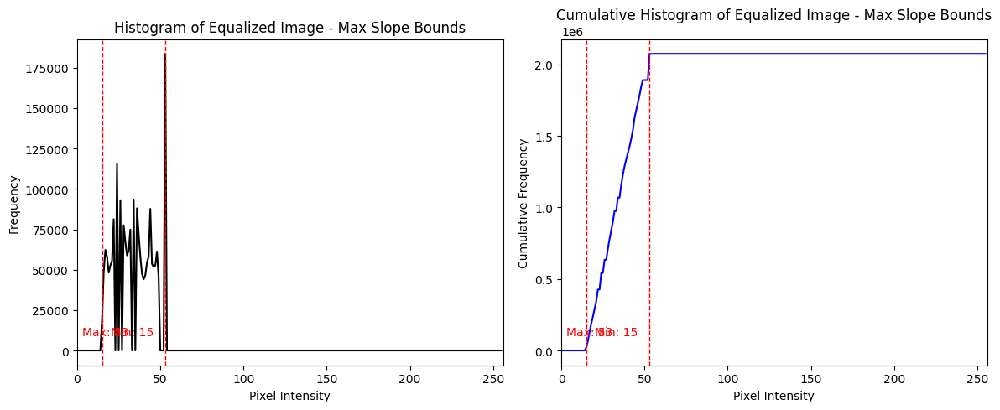

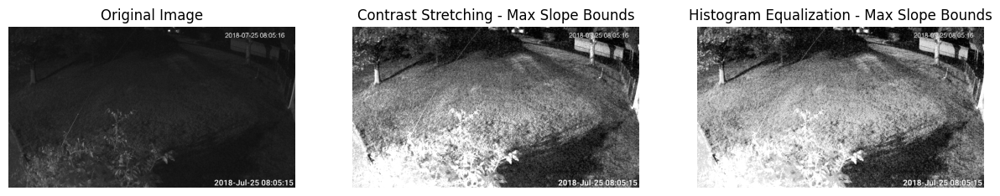

In [19]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_5))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_5, color_pairs_percentage, color_pair_max_slope)

For 5%: Min intensity = 2, Max intensity = 180
For 10%: Min intensity = 4, Max intensity = 163
For 15%: Min intensity = 6, Max intensity = 149
Max slope intensities: Min = 0, Max = 185


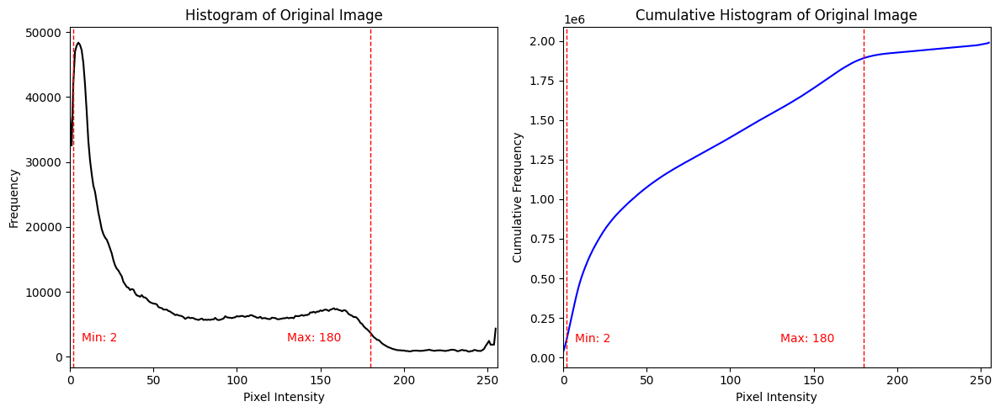

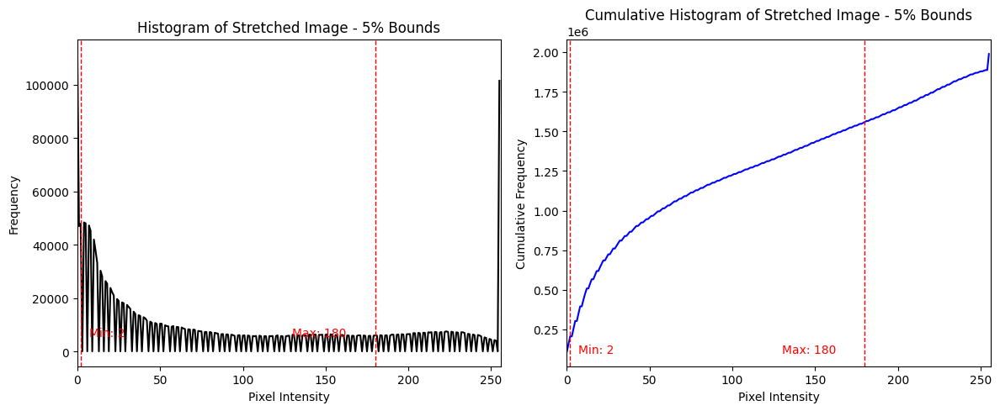

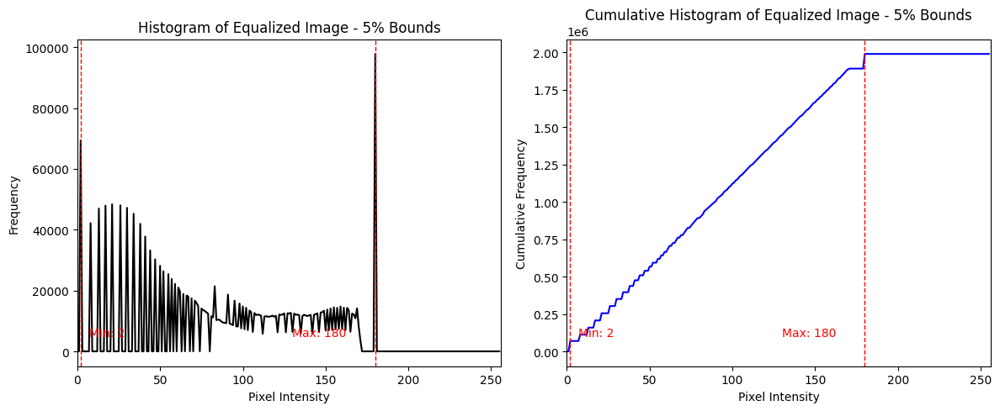

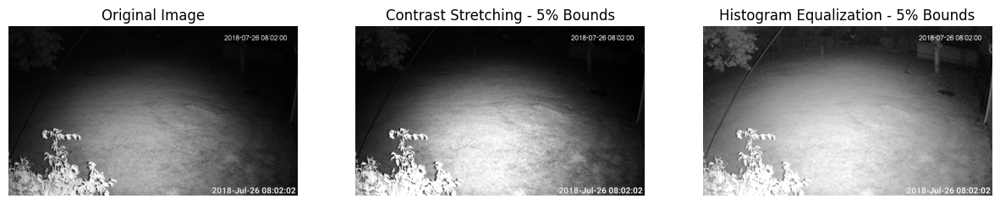

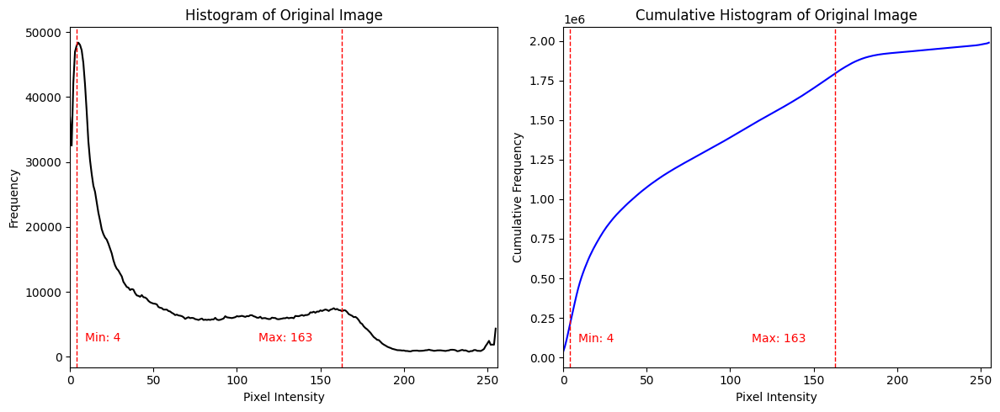

...

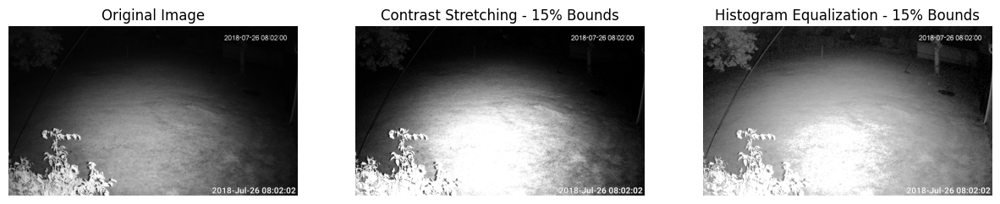

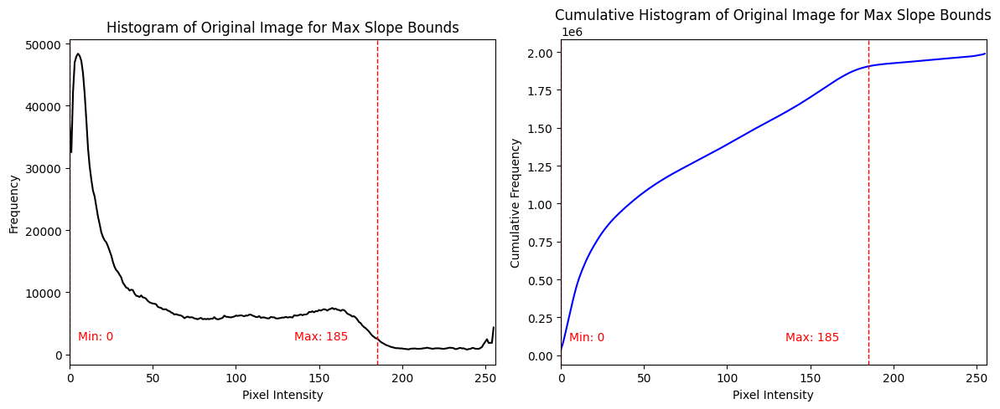

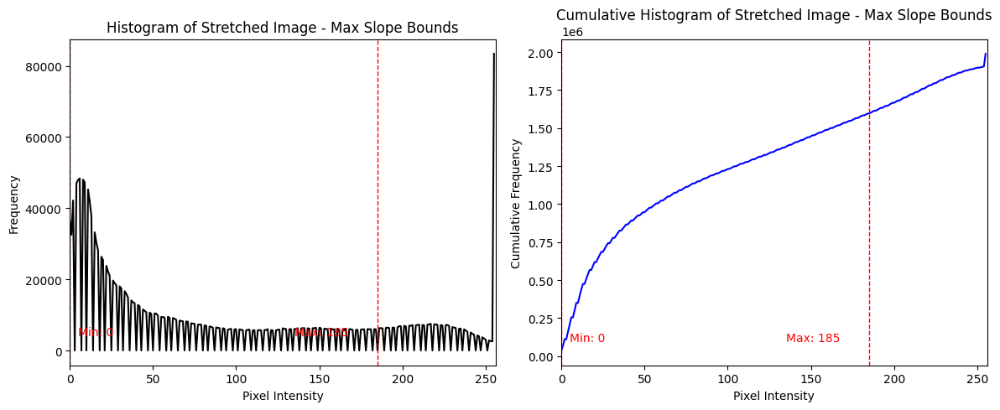

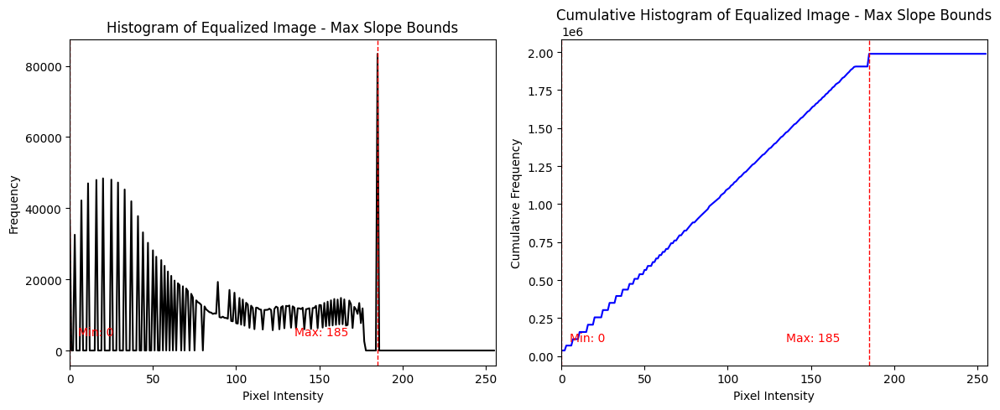

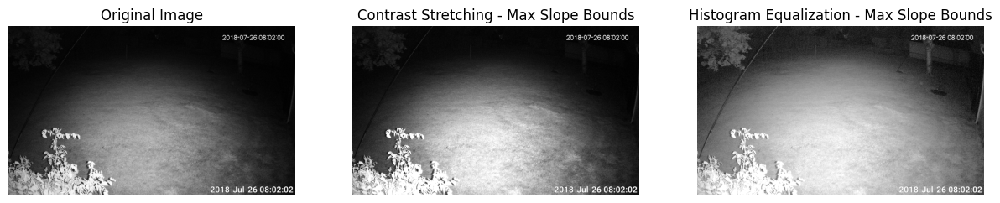

In [20]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_6))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_6, color_pairs_percentage, color_pair_max_slope)

For 5%: Min intensity = 41, Max intensity = 255
For 10%: Min intensity = 46, Max intensity = 255
For 15%: Min intensity = 49, Max intensity = 255
Max slope intensities: Min = 254, Max = 255


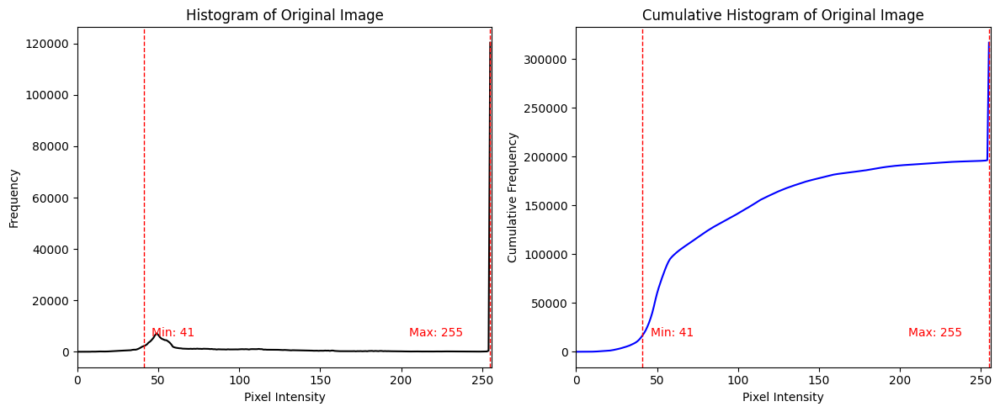

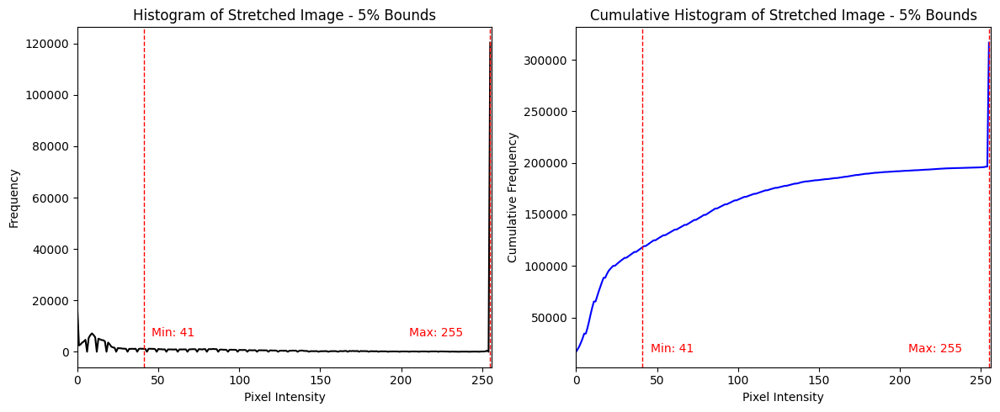

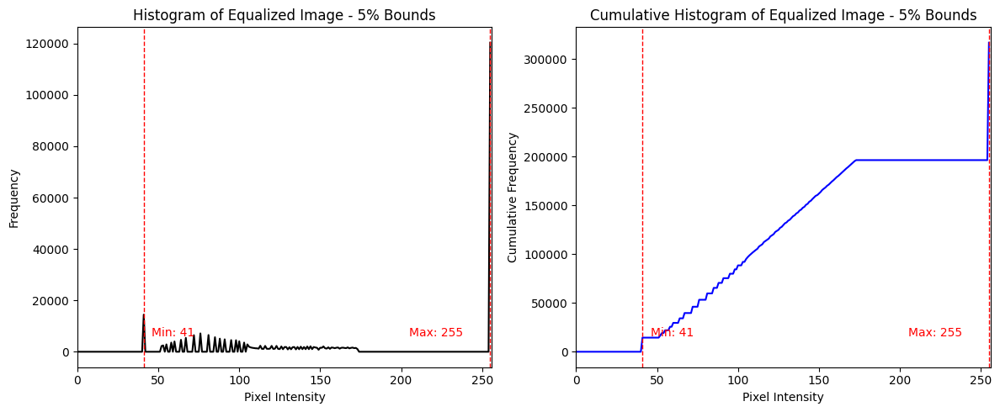

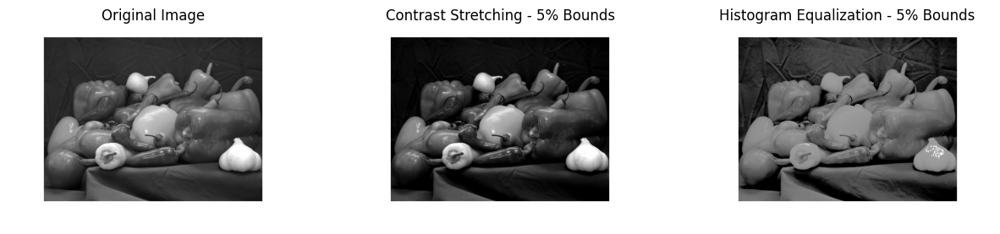

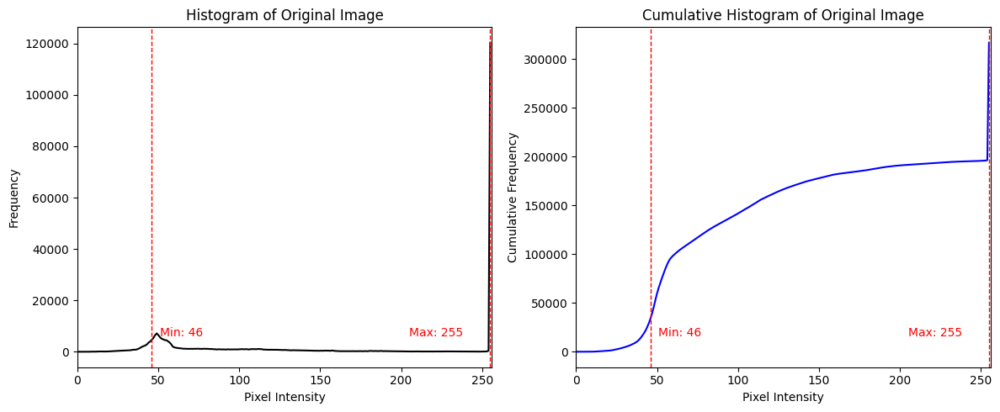

...

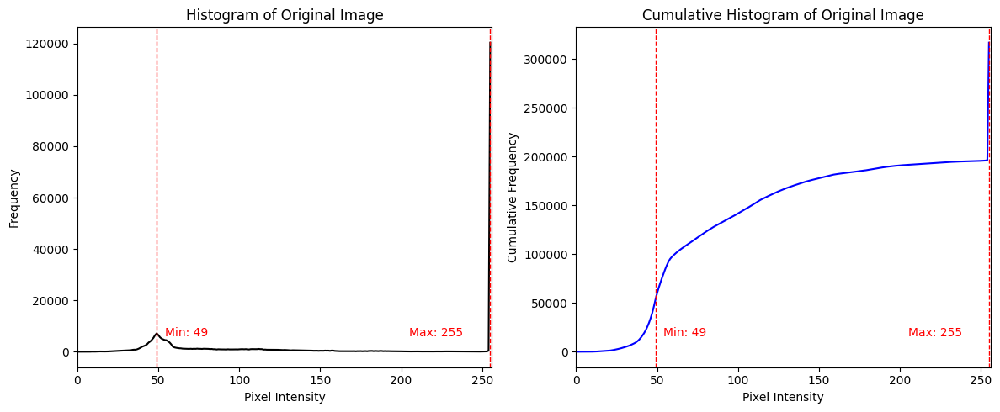

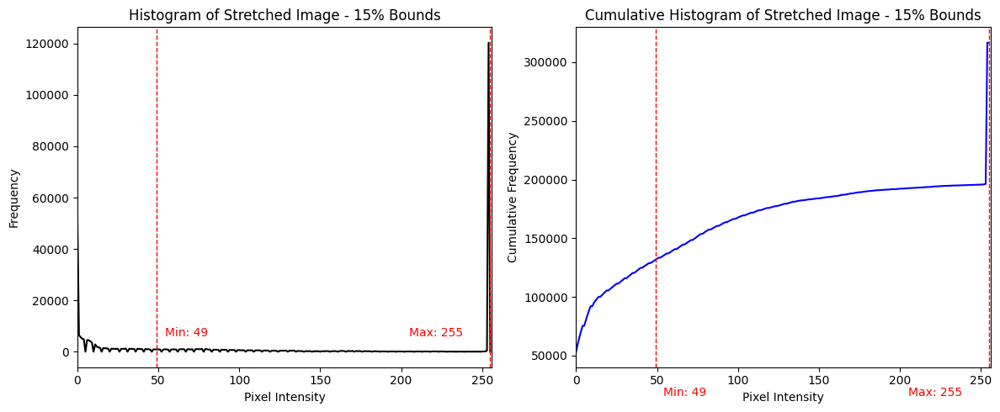

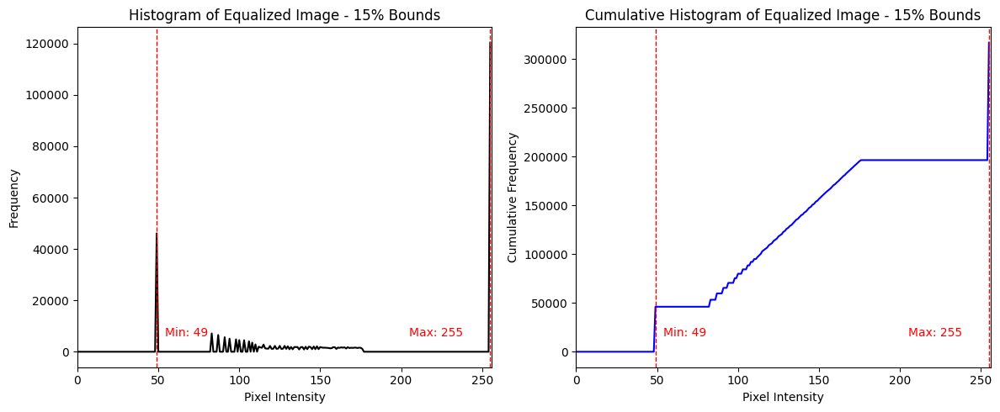

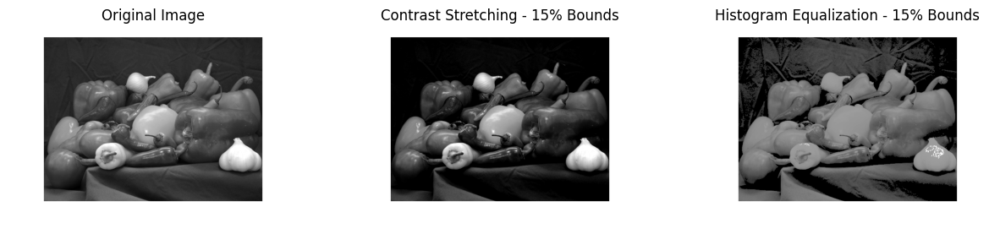

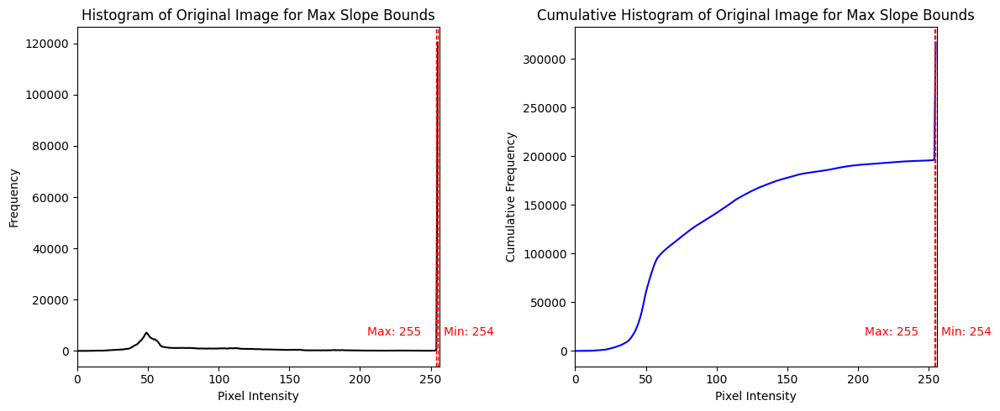

/var/folders/_v/bvnn4hjs0h799wbkxyvnm5hm0000gn/T/ipykernel_76504/3674411540.py:35: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


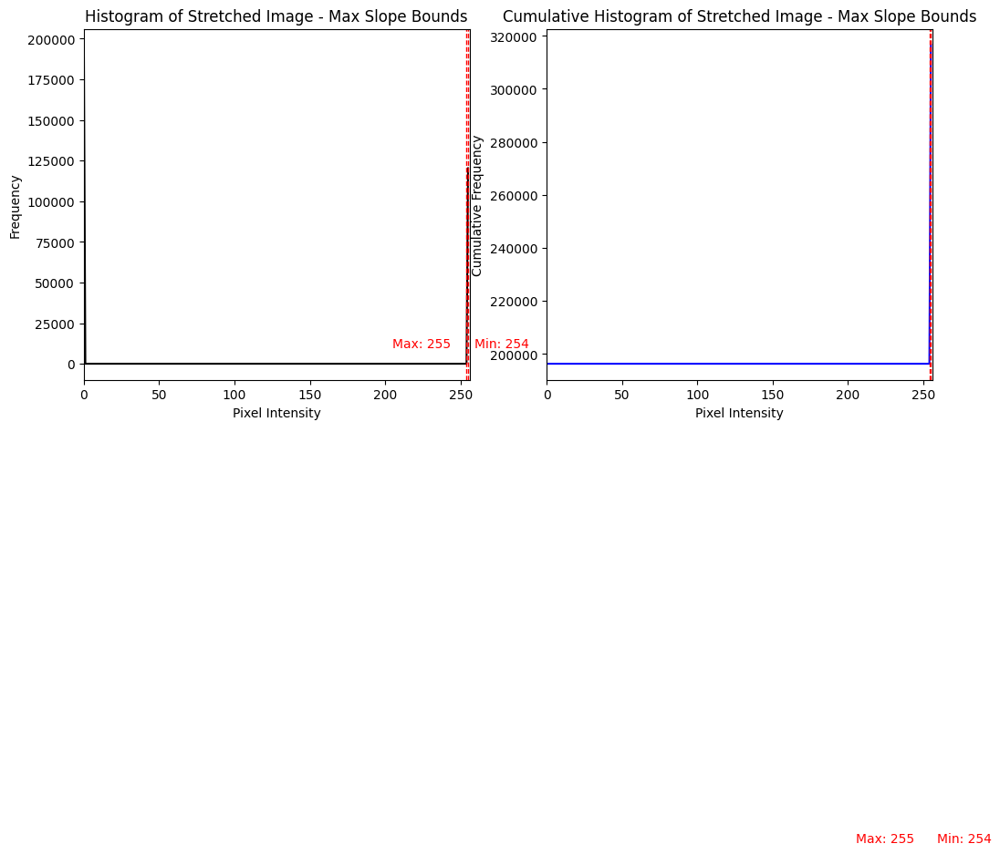

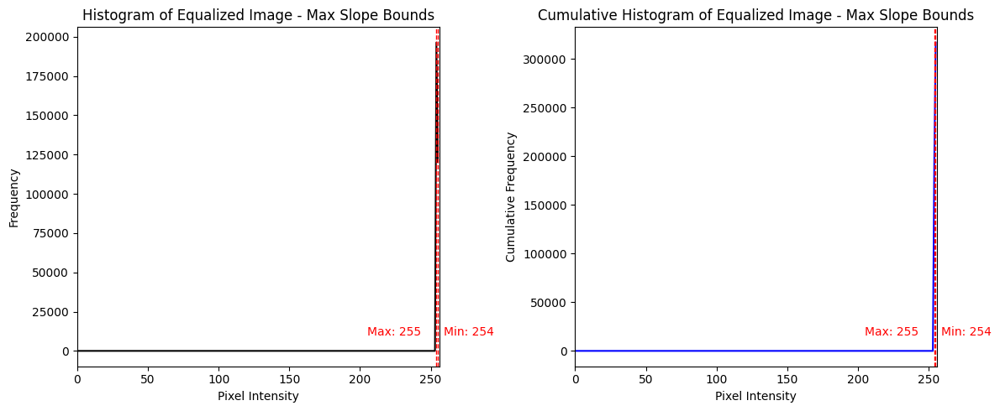

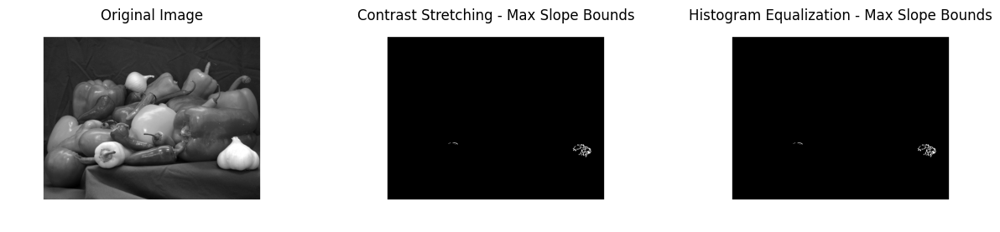

In [21]:
cumulative_histogram = CalculateCumulativeHistogram(CalculateHistogram(image_array_7))
color_pairs_percentage, color_pair_max_slope = evaluate_analyze_histogram(cumulative_histogram)

evaluate_modify_histogram(image_array_7, color_pairs_percentage, color_pair_max_slope)